# Camera calibration (distorition correction) tutorial

Made by: Anna Casto

Updated: April 16, 2024

Some cameras create distortions (e.g. fisheye) that get in the way of accurate computer vision measurements. These camera calibration functions use images of checkerboards to correct camera distortions. Once a camera has been calibrated, it is possible to use the outputs of the *checkerboard_calib* function to correct any images taken with that camera.

In [2]:
import os

# Detect notebook environment
def detect_notebook_environment():
    if 'COLAB_GPU' in os.environ:
        print('Google Colaboratory detected.')
        %pip install "altair>=5" ipympl plantcv
        
        # Give access and mount your Google Drive (need a Google Account)
        from google.colab import drive
        drive.mount('/content/gdrive')
        
        # Enable widget feature with matplotlib
        from google.colab import output
        output.enable_custom_widget_manager()
        
        #View working directory, may need to change
        %pwd
    else:
        print('Binder detected.')

environment = detect_notebook_environment()

Binder detected.


In [3]:
# If working in Binder, widget may not be functioning
# %matplotlib inline
%matplotlib widget
from plantcv import plantcv as pcv
from plantcv.parallel import WorkflowInputs

In [4]:
# Set debug to the global parameter 
pcv.params.debug = "plot"
# Change display settings
pcv.params.dpi = 100
pcv.params.text_size = 20
pcv.params.text_thickness = 20

### Read in checkerboard images and calibrate camera
It is recommended to use > 10 images of the same checkerboard placed in different areas of the field of view, as shown in the examples below. Make sure all checkerboard squares are at least partially within frame. Checkerboards should be at least 6 x 6 squares.

<img src="./img/checkerboard_imgdir/checkerboard4.png" alt="example 1" width="450"/>
<img src="./img/checkerboard_imgdir/checkerboard2.png" alt="example 2" width="450"/>

It is also important to make sure you are counting the column and row corners correctly. Count the *inner corners* of the checkerboard squares rather than the squares themselves. In the example image below, the counted corners are indicated by the colored dots. In this case there are 13 corners per column and 19 corners per row.

![Checkerboard corner counting example](./img/corner_example.png)

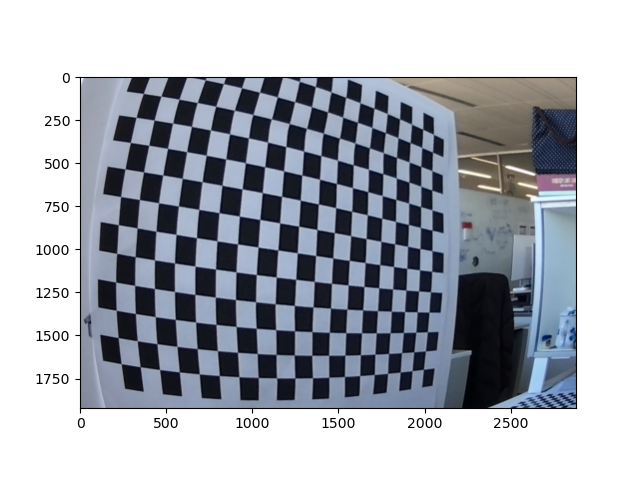

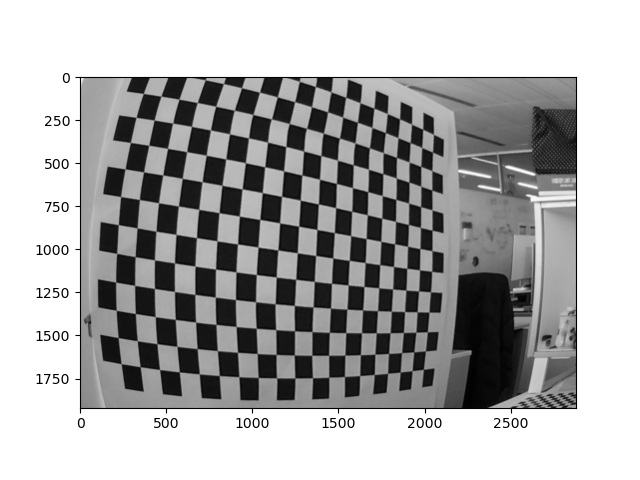

Checkerboard image bad_checkerboard.png does not match given dimensions.


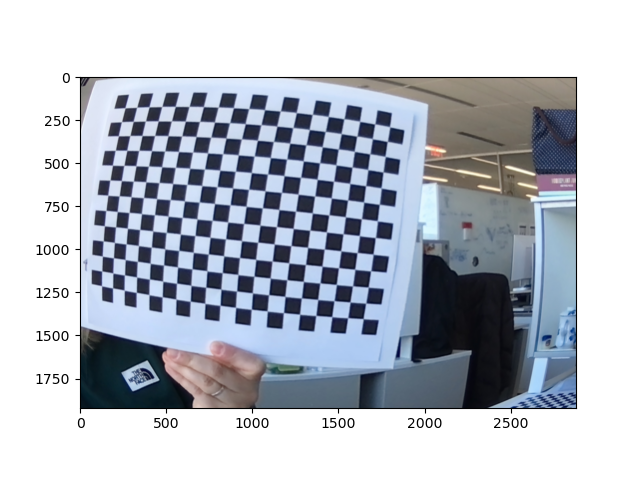

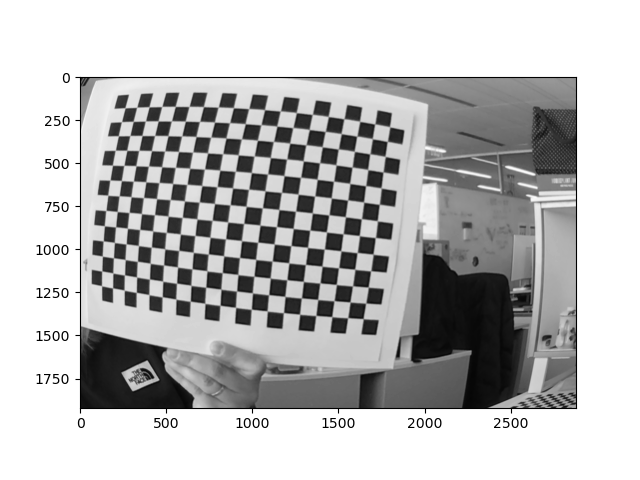

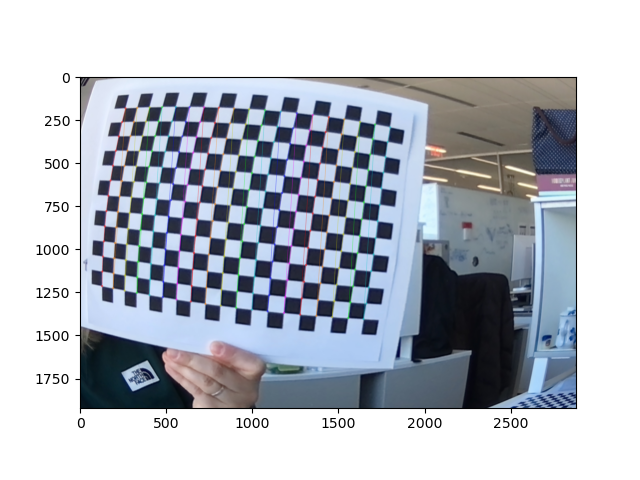

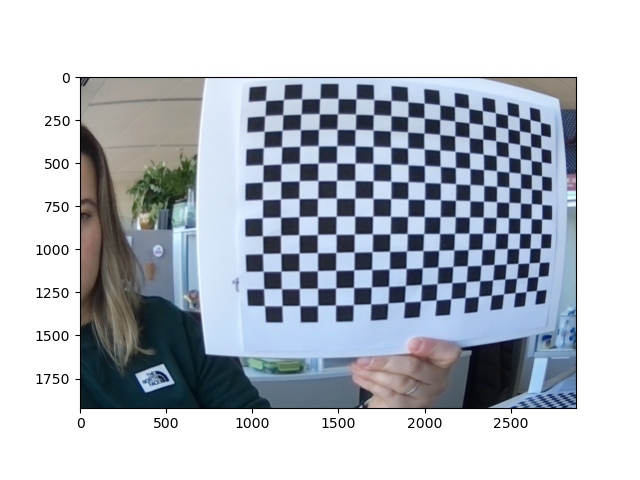

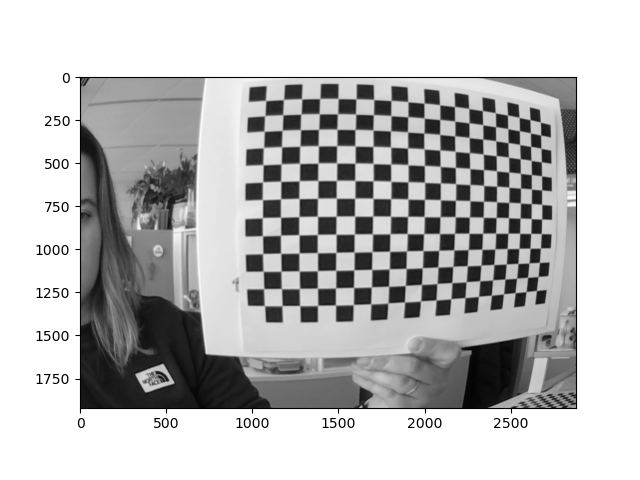

...

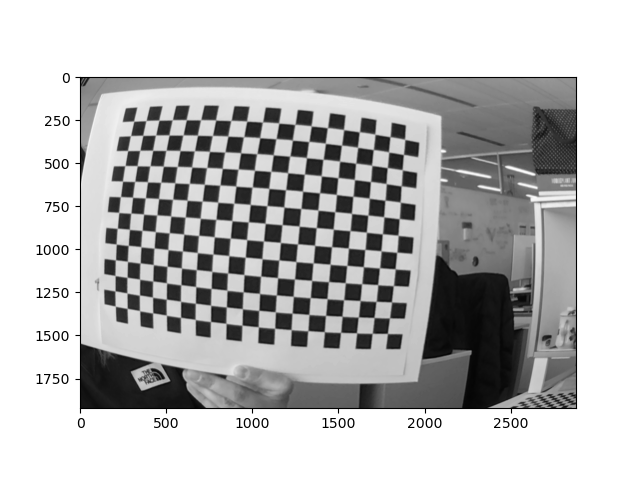

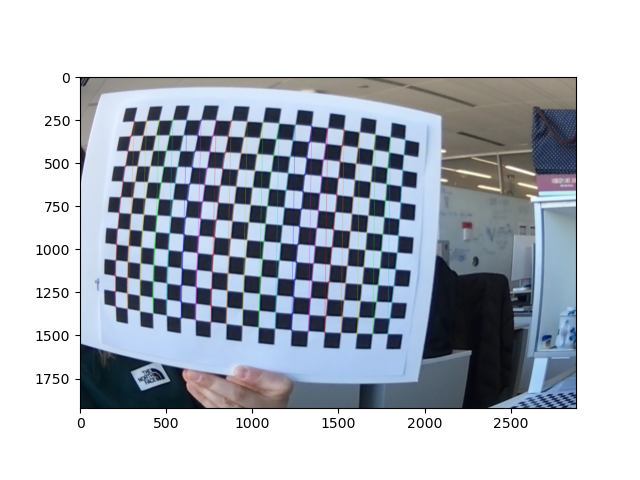

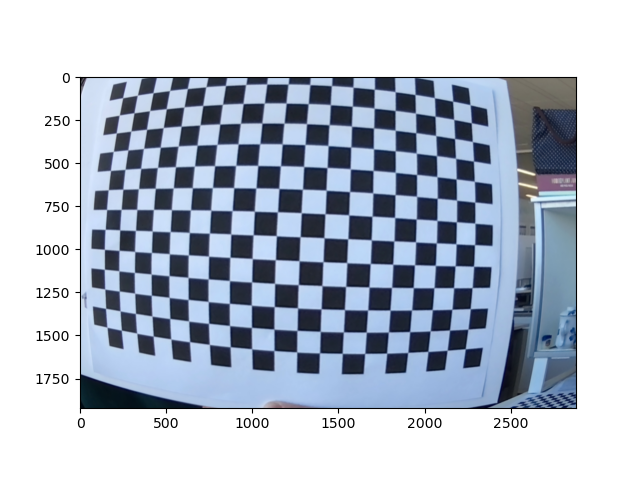

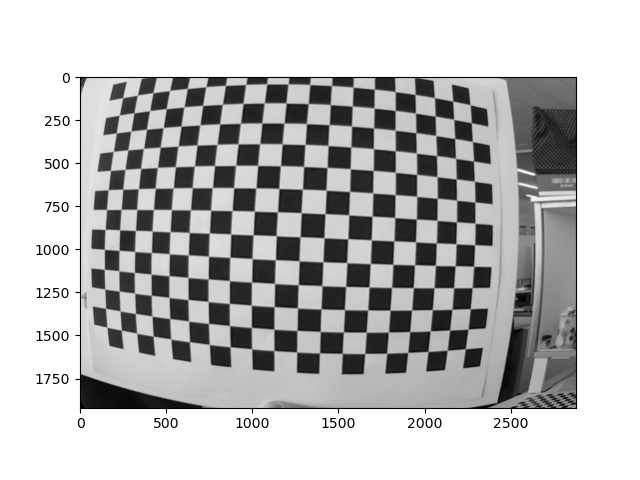

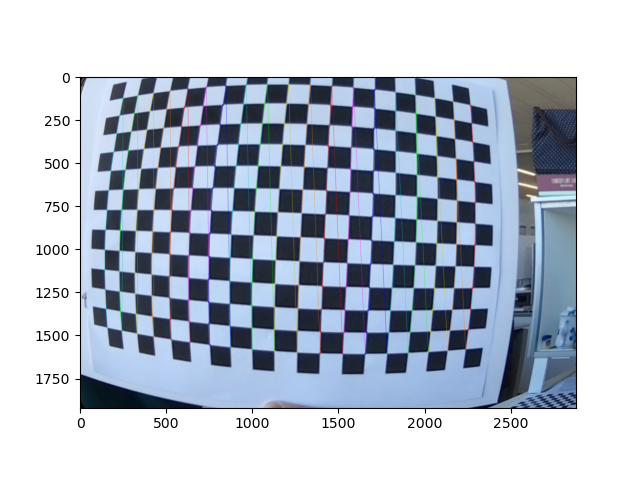

/Users/acasto/Documents/GitHub/plantcv/plantcv/plantcv/plot_image.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


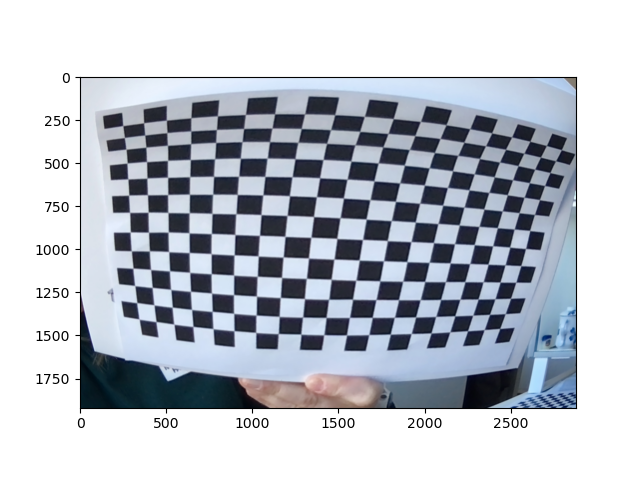

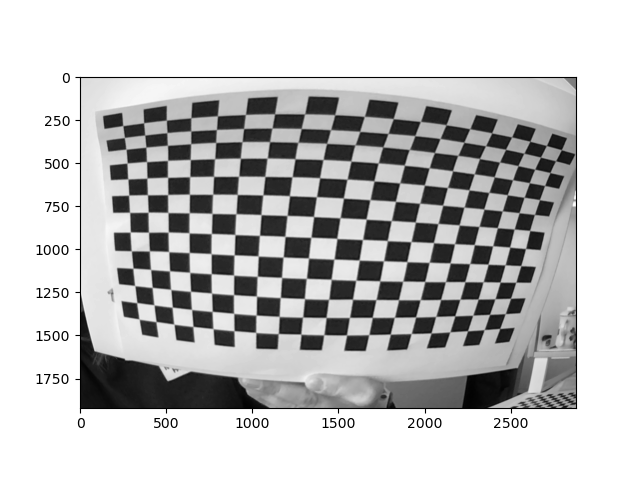

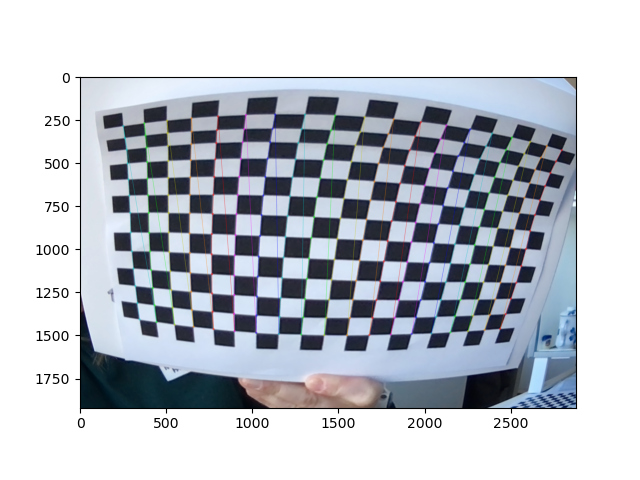

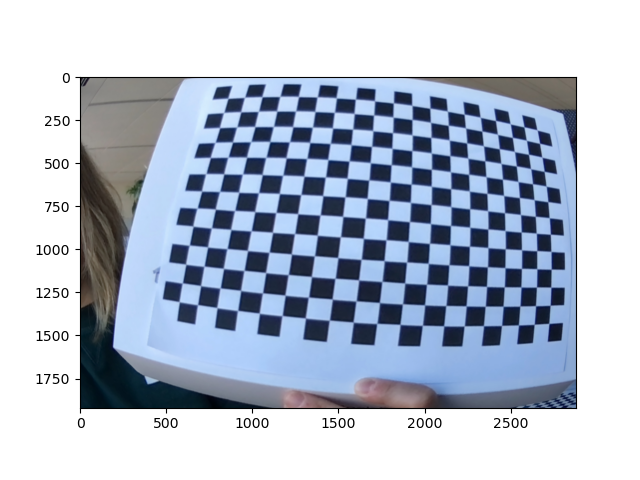

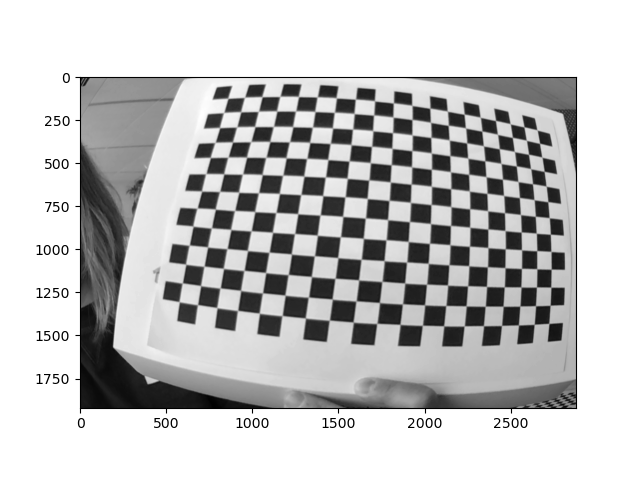

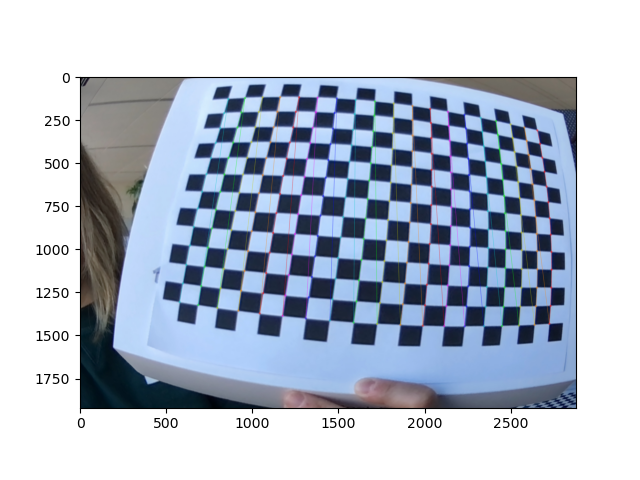

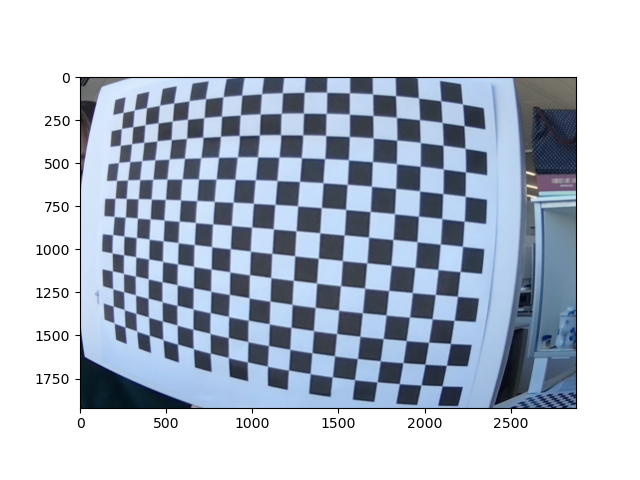

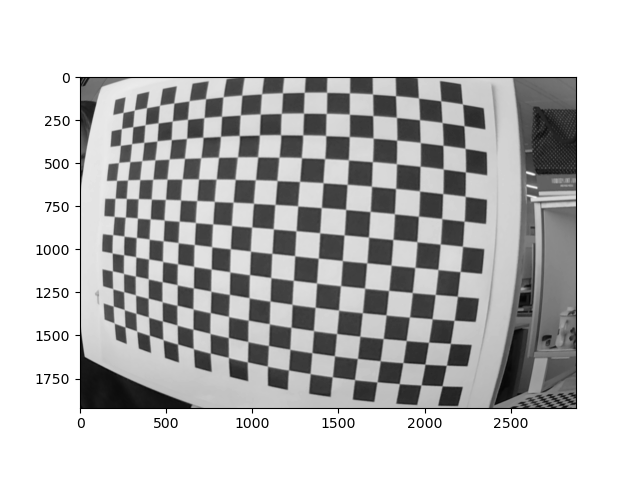

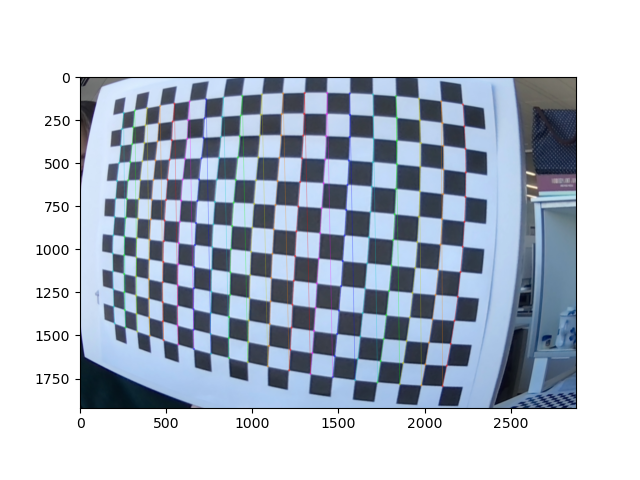

In [5]:
mtx, dist = pcv.transform.checkerboard_calib(img_path = "./img/checkerboard_imgdir/", col_corners = 13, row_corners = 19, out_dir = "./")

### Read in distorted image

In [ ]:
# Input/output options
args = WorkflowInputs(
    images=["./img/fisheye_test_img.jpg"],
    names="image",
    result="example_results.json",
    outdir=".",
    writeimg=False,
    debug="plot"
    )

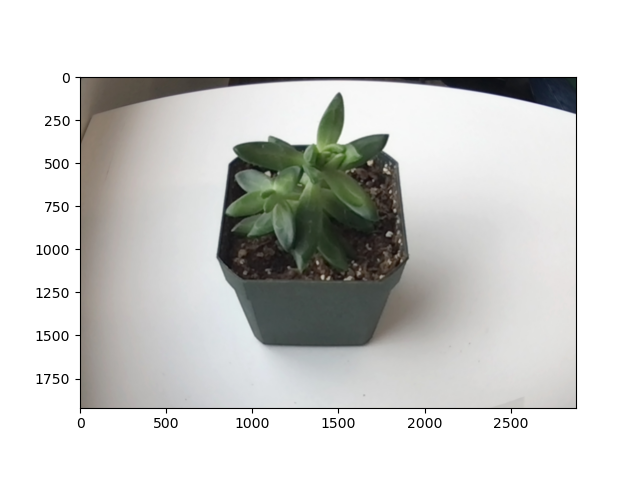

In [6]:
img, path, fname = pcv.readimage(filename= args.image, mode="native")

### Correct image

In [1]:
corrected_img = pcv.transform.calibrate_camera(rgb_img=img, mtx_filename = "mtx.npz", dist_filename = "dist.npz")

NameError: name 'pcv' is not defined

The corrected image can now be analyzed using standard workflow steps like [Simple RGB workflow tutorial](https://plantcv.readthedocs.io/en/latest/tutorials/simple_RGB_workflow_tutorial/) or [Single plant RGB workflow tutorial](https://plantcv.readthedocs.io/en/latest/tutorials/vis_tutorial/).